## Importer les librairies qu'on va utiliser

In [147]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder

# I ) L’exploration des données 

## Objectif :

. Comprendre du mieux possible nos données.

. développer une première stratégie de modélisation.

## 1) Analyse de la forme des données

NOTE : la variable de target est "Fatalities"

### La lecture et l'affichage de dataset

In [148]:
data=pd.read_csv("Desktop/dataset/train.csv")

In [149]:
df = data.copy()
df.head()

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
0,1,NaN,Afghanistan,2020-01-22,0.0,0.0
1,2,NaN,Afghanistan,2020-01-23,0.0,0.0
2,3,NaN,Afghanistan,2020-01-24,0.0,0.0
3,4,NaN,Afghanistan,2020-01-25,0.0,0.0
4,5,NaN,Afghanistan,2020-01-26,0.0,0.0


### Le nombre de lignes et colonnes  

In [150]:
df.shape

(35995, 6)

### visualisation des variables

In [151]:
df.dtypes.value_counts()

object     3
float64    2
int64      1
dtype: int64

<AxesSubplot:ylabel='None'>

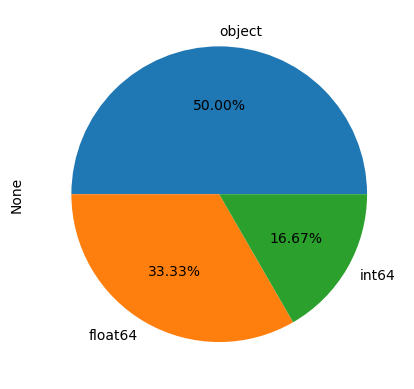

In [7]:
df.dtypes.value_counts().plot.pie(autopct='%.2f%%')

In [152]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35995 entries, 0 to 35994
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Id              35995 non-null  int64  
 1   Province_State  15295 non-null  object 
 2   Country_Region  35995 non-null  object 
 3   Date            35995 non-null  object 
 4   ConfirmedCases  35995 non-null  float64
 5   Fatalities      35995 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 1.6+ MB


### L'analyse des valeurs manquantes

le résultat de la methode de seaborne ci-dessous : en blanc c'est les valeurs manquante et en noire c'est ou il ya des valeurs  

<AxesSubplot:>

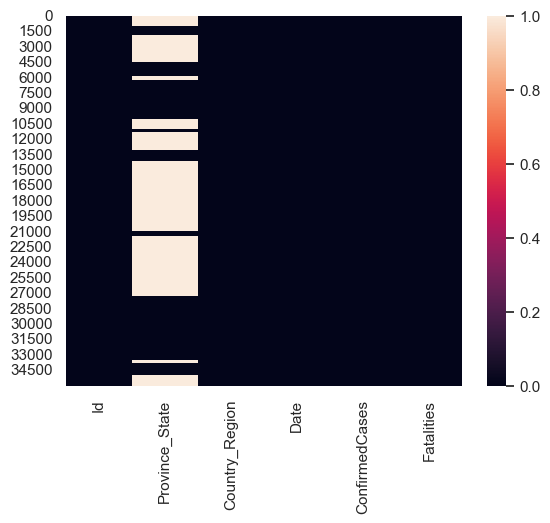

In [153]:
sns.heatmap(df.isna())

In [154]:
(df.isna().sum()/df.shape[0]).sort_values

<bound method Series.sort_values of Id                0.00000
Province_State    0.57508
Country_Region    0.00000
Date              0.00000
ConfirmedCases    0.00000
Fatalities        0.00000
dtype: float64>

En à remarquer que la plupart de nos variables sont complétement non vide et juste une seule variable "Province_State" contient 57% de ces valeurs sont vide.

## 2 ) L'analyse du Fond

### Visualisation initiale - Élimination des colonnes inutiles

Suppression de la colonnes "Id" parceque elle est inutils

In [155]:
df = df.drop('Id', axis=1)

In [12]:
df.head()

,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
0,NaN,Afghanistan,2020-01-22,0.0,0.0
1,NaN,Afghanistan,2020-01-23,0.0,0.0
2,NaN,Afghanistan,2020-01-24,0.0,0.0
3,NaN,Afghanistan,2020-01-25,0.0,0.0
4,NaN,Afghanistan,2020-01-26,0.0,0.0


### Visualisation de target

In [156]:
fatalities_info=df['Fatalities'].value_counts()/df.shape[0]

In [157]:
pd.set_option('display.max_rows', None)
fatalities_info

0.0        0.563662
1.0        0.063953
2.0        0.035866
3.0        0.029671
6.0        0.021864
4.0        0.017336
7.0        0.013557
8.0        0.011752
5.0        0.011363
9.0        0.009085
10.0       0.008029
13.0       0.006334
12.0       0.004612
11.0       0.004362
22.0       0.004112
14.0       0.003862
16.0       0.003334
18.0       0.003112
17.0       0.002917
21.0       0.002750
15.0       0.002639
20.0       0.002556
19.0       0.002278
25.0       0.002195
41.0       0.002111
24.0       0.002084
23.0       0.001889
26.0       0.001834
31.0       0.001750
27.0       0.001611
40.0       0.001472
38.0       0.001445
32.0       0.001417
29.0       0.001389
44.0       0.001361
35.0       0.001334
46.0       0.001334
28.0       0.001334
34.0       0.001334
43.0       0.001306
48.0       0.001222
45.0       0.001167
33.0       0.001111
54.0       0.001083
50.0       0.001083
36.0       0.001028
42.0       0.001000
30.0       0.001000
56.0       0.000972
51.0       0.000972


### Visualisation de la distribution des variables continue : Histogrames

/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


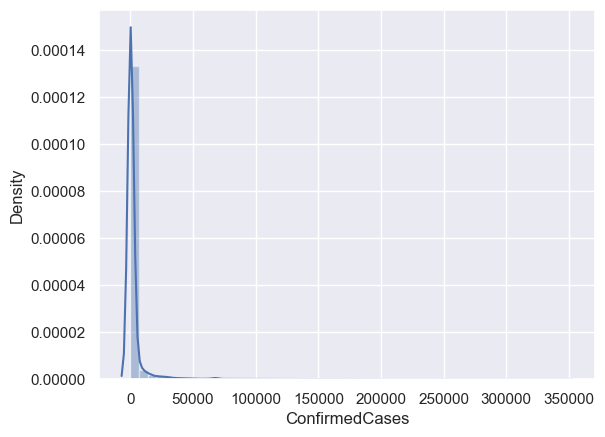

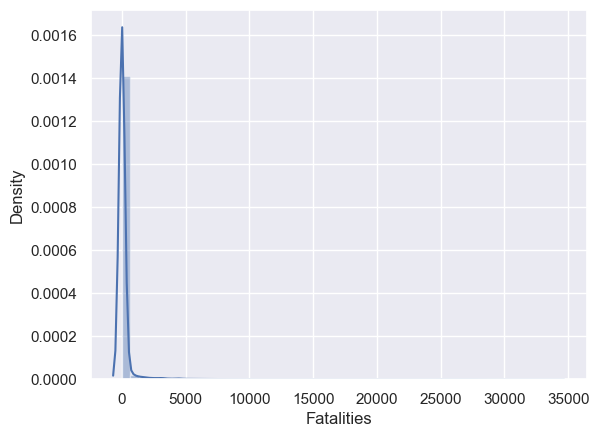

In [158]:
for col in df.select_dtypes('float'):
    plt.figure()
    sns.distplot(df[col])

ce qui signifie que la plupart des valeurs se situent autour de la moyenne et que les valeurs extrêmes sont rares

In [159]:
df['ConfirmedCases'].value_counts().count()

6000

In [160]:
df['Fatalities'].value_counts().count()

1879

### présentation des variables Qualitatives

In [161]:
for col in df.select_dtypes('object'):
    
     print(f'{col :-<120}{df[col].unique()}','----> Le nombre de catégories est :',len(df[col].unique()))
        

Province_State----------------------------------------------------------------------------------------------------------[nan 'Australian Capital Territory' 'New South Wales' 'Northern Territory'
 'Queensland' 'South Australia' 'Tasmania' 'Victoria' 'Western Australia'
 'Alberta' 'British Columbia' 'Manitoba' 'New Brunswick'
 'Newfoundland and Labrador' 'Northwest Territories' 'Nova Scotia'
 'Ontario' 'Prince Edward Island' 'Quebec' 'Saskatchewan' 'Yukon' 'Anhui'
 'Beijing' 'Chongqing' 'Fujian' 'Gansu' 'Guangdong' 'Guangxi' 'Guizhou'
 'Hainan' 'Hebei' 'Heilongjiang' 'Henan' 'Hong Kong' 'Hubei' 'Hunan'
 'Inner Mongolia' 'Jiangsu' 'Jiangxi' 'Jilin' 'Liaoning' 'Macau' 'Ningxia'
 'Qinghai' 'Shaanxi' 'Shandong' 'Shanghai' 'Shanxi' 'Sichuan' 'Tianjin'
 'Tibet' 'Xinjiang' 'Yunnan' 'Zhejiang' 'Faroe Islands' 'Greenland'
 'French Guiana' 'French Polynesia' 'Guadeloupe' 'Martinique' 'Mayotte'
 'New Caledonia' 'Reunion' 'Saint Barthelemy' 'Saint Pierre and Miquelon'
 'St Martin' 'Aruba' 'Bonaire, 

### Le nombre des catégories dans la dataset 

In [162]:
df['Province_State'].value_counts().count()

133

In [163]:
df['Country_Region'].value_counts().count()

184

In [164]:
df['Date'].value_counts().count()

115

### visualisation de la correlation entre les variables qualitatives

In [165]:
pd.crosstab(df['Province_State'], df['Country_Region'])

Country_Region,Australia,Canada,China,Denmark,France,Netherlands,US,United Kingdom
Province_State,,,,,,,,
Alabama,0,0,0,0,0,0,115,0
Alaska,0,0,0,0,0,0,115,0
Alberta,0,115,0,0,0,0,0,0
Anguilla,0,0,0,0,0,0,0,115
Anhui,0,0,115,0,0,0,0,0
Arizona,0,0,0,0,0,0,115,0
Arkansas,0,0,0,0,0,0,115,0
Aruba,0,0,0,0,0,115,0,0
Australian Capital Territory,115,0,0,0,0,0,0,0


### Le nombre d'apparition de chaque catégorie des variables Qualitatives

In [166]:
for col in df.select_dtypes('object'):
    print(f'{col :-<120}{df[col].value_counts()}') 

Province_State----------------------------------------------------------------------------------------------------------Australian Capital Territory        115
Indiana                             115
Nevada                              115
Nebraska                            115
Montana                             115
Missouri                            115
Mississippi                         115
Minnesota                           115
Michigan                            115
Massachusetts                       115
Maryland                            115
Maine                               115
Louisiana                           115
Kentucky                            115
Kansas                              115
Iowa                                115
Illinois                            115
Curacao                             115
Idaho                               115
Hawaii                              115
Guam                                115
Georgia                             115


Le nombre d'appartion de toutes les catégories de la variable 'Province_State' est 115 fois , qui représente le nombre des dates , Donc c'est très biens ca pose pas de problème.

Le nombre d'appartion de toutes les catégories de la variable 'Country_Region' est 115 fois appart (US , China, canada, France , United Kingdom, Australia, Netherlands, Denmark . ca veut dire que dans le dataset ces pays ont des lignes avec la même date (ca peut poser un problème)

### Visualisation des variables Quantitatives

/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='Province_State', ylabel='Density'>

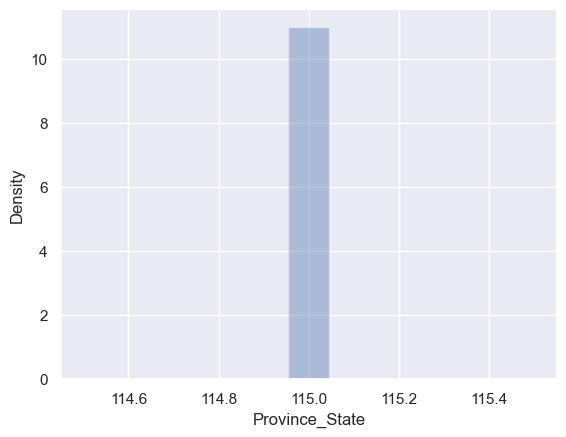

In [167]:
sns.distplot(df['Province_State'].value_counts())

/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Country_Region', ylabel='Density'>

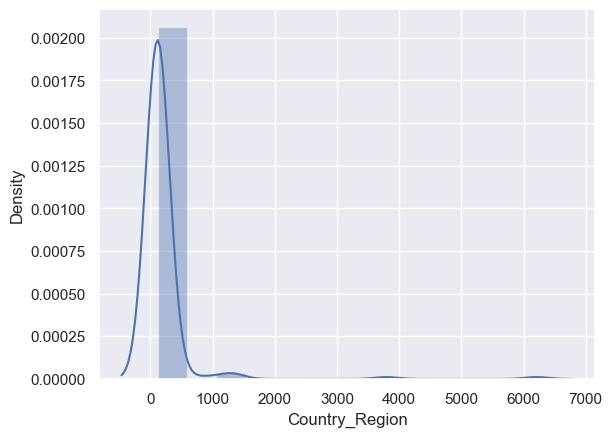

In [168]:
sns.distplot(df['Country_Region'].value_counts())

/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='Date', ylabel='Density'>

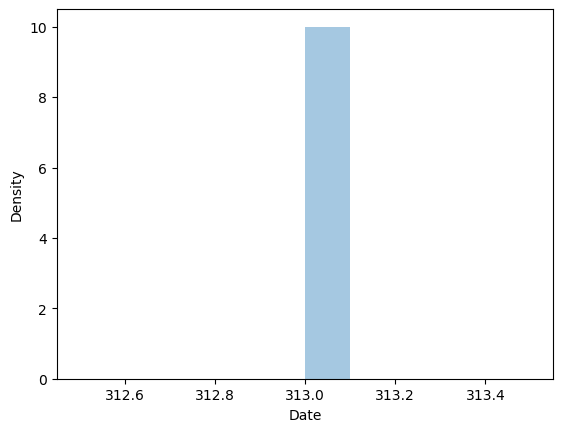

In [25]:
sns.distplot(df['Date'].value_counts())

# Relation Target  / Country_region / Date

In [169]:
dataset=df[['Country_Region','Fatalities']]

###  Le nombre totale de Fatalities dans chaque Country_Region

In [170]:
def get_fatalities_by_country(df):
    df_fatalities_by_country = df.groupby(['Country_Region']).sum()
    return df_fatalities_by_country

df1=get_fatalities_by_country(dataset)
df1

,Fatalities
Country_Region,
Afghanistan,2523.0
Albania,1284.0
Algeria,16883.0
Andorra,1658.0
Angola,96.0
Antigua and Barbuda,107.0
Argentina,7996.0
Armenia,1175.0
Australia,3456.0


### Les premier cinq pays qui ont le plus grand nombre de Fatalities

In [269]:
df_sorted = df1.sort_values(by='Fatalities', ascending=False)
country_moste_fatalities=df_sorted.head(5)
country_moste_fatalities

,Fatalities
Country_Region,
US,2122579.0
Italy,1211456.0
Spain,995560.0
United Kingdom,933303.0
France,899572.0


<BarContainer object of 5 artists>

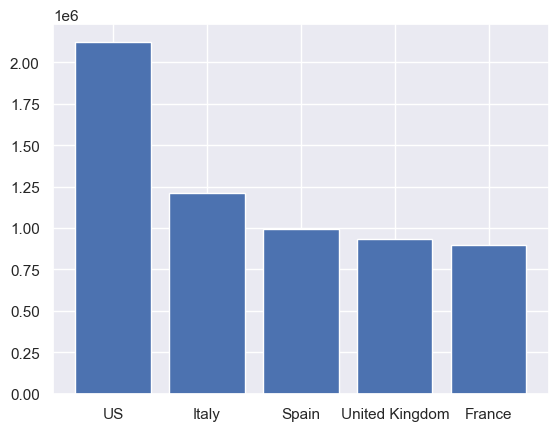

In [172]:
pays = ["US", "Italy", "Spain", "United Kingdom", "France"]
fatalities = [2122579.0, 1211456.0, 995560.0, 933303.0,899572.0 ]
plt.bar(pays, fatalities)

### Les pays qui ont le nombre totale de fatalities Zéro 

In [274]:
#we should use values from columns that we have indexed with
country_less_fatalities = df_sorted.iloc[160:]
country_less_fatalities

,Fatalities
Country_Region,
Grenada,0.0
Madagascar,0.0
Saint Kitts and Nevis,0.0
Rwanda,0.0
Seychelles,0.0
Dominica,0.0
Vietnam,0.0
Laos,0.0
Western Sahara,0.0


### la relation des variables de dataset

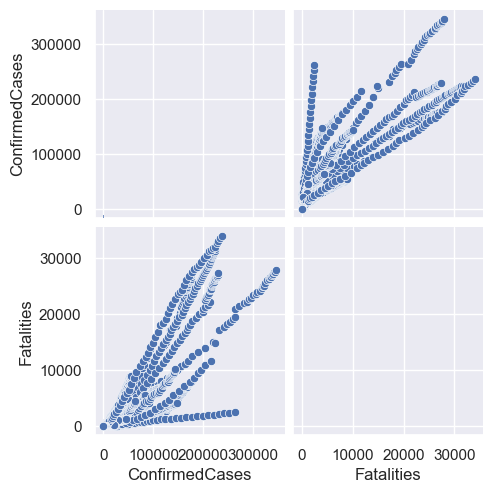

In [175]:
sns.pairplot(df);

# 2 ) PRE-PROCESSING

In [176]:
data_pro = data.copy()
data.shape

(35995, 6)

In [177]:
data_pro.drop_duplicates(keep='first',inplace=True)
data_pro.shape

(35995, 6)

En remarque que il ya pas des lignes dupliquer

## Selection de nos variables dans Train dataset

Élimination de la variable 'Province_State' dans train dataset et Test dataset parceque 57% des valeurs sont manquentes et c'est une cariable catécoriale on peur pas remplire des lignes vides .

In [178]:
data_pro= data_pro[['Country_Region','Date','Fatalities']]
data_pro.shape

(35995, 3)

# Nettoyage - Encodage 

## nettoyer la dataset

Il ya des pays qui ont un nombre de Fatalities différent dans une même date mais dans des 'Province_State' différent . vu que on a éliminer la colonne 'Province_State' il reste des lignes avec la même 'Country_Region' et la même 'Date' mais un nombre de fatalities différent et ça c'est pas logique . Donc en à créer une fonction qui faire la somme des Fatalities dans chaque pays qui apparait dans la dataset dans la même date .  

In [179]:
def get_fatalities_by_country_Date(df):
    df_fatalities_by_country_Date = df.groupby(['Country_Region','Date'],as_index=False).sum()
    return df_fatalities_by_country_Date

clean_train_data=get_fatalities_by_country_Date(data_pro)
clean_train_data

,Country_Region,Date,Fatalities
0,Afghanistan,2020-01-22,0.0
1,Afghanistan,2020-01-23,0.0
2,Afghanistan,2020-01-24,0.0
3,Afghanistan,2020-01-25,0.0
4,Afghanistan,2020-01-26,0.0
5,Afghanistan,2020-01-27,0.0
6,Afghanistan,2020-01-28,0.0
7,Afghanistan,2020-01-29,0.0
8,Afghanistan,2020-01-30,0.0
9,Afghanistan,2020-01-31,0.0


In [181]:
clean_train_data.shape

(21160, 3)

### La vérification que les pays ( les ctégories de la variable  Country_Region ) apparaitre dans la dataset 115 fois qui représente de nombre des dates qui existe ( le nombre de catégories de la varible Date )

In [182]:
clean_train_data['Country_Region'].value_counts()

Afghanistan                         115
Norway                              115
Mozambique                          115
Namibia                             115
Nepal                               115
Netherlands                         115
New Zealand                         115
Nicaragua                           115
Niger                               115
Nigeria                             115
North Macedonia                     115
Oman                                115
Albania                             115
Pakistan                            115
Panama                              115
Papua New Guinea                    115
Paraguay                            115
Peru                                115
Philippines                         115
Poland                              115
Portugal                            115
Qatar                               115
Morocco                             115
Montenegro                          115
Mongolia                            115


In [183]:
len(clean_train_data['Country_Region'].unique())

184

## Encodage 

### Encodage de la variable " Country_Region " dans la Train et Test dataset

In [184]:
from sklearn.preprocessing import LabelEncoder

In [185]:
label_encoder = LabelEncoder()

In [186]:
clean_train_data["Country_Region"] = label_encoder.fit_transform(clean_train_data["Country_Region"])

In [187]:
clean_train_data

,Country_Region,Date,Fatalities
0,0,2020-01-22,0.0
1,0,2020-01-23,0.0
2,0,2020-01-24,0.0
3,0,2020-01-25,0.0
4,0,2020-01-26,0.0
5,0,2020-01-27,0.0
6,0,2020-01-28,0.0
7,0,2020-01-29,0.0
8,0,2020-01-30,0.0
9,0,2020-01-31,0.0


In [188]:
clean_train_data.dtypes

Country_Region      int64
Date               object
Fatalities        float64
dtype: object

### Transformation le type Object de la variable "Date" à "datetime" dans la Train et Test dataset 

In [189]:
import datetime as dt

In [190]:
clean_train_data["Date"] =  pd.to_datetime(clean_train_data["Date"], format="%Y/%m/%d")

In [191]:
clean_train_data.dtypes

Country_Region             int64
Date              datetime64[ns]
Fatalities               float64
dtype: object

In [192]:
clean_train_data.head()

,Country_Region,Date,Fatalities
0,0,2020-01-22,0.0
1,0,2020-01-23,0.0
2,0,2020-01-24,0.0
3,0,2020-01-25,0.0
4,0,2020-01-26,0.0


###  Encodage de la variable " Date " dans train dataset and test dataset

In [193]:
avg, dev = clean_train_data['Date'].mean(), clean_train_data['Date'].std()

In [194]:
date_Train = (clean_train_data['Date'] - avg) / dev

In [195]:
date_Train

0       -1.717014
1       -1.686891
2       -1.656768
3       -1.626645
4       -1.596522
5       -1.566399
6       -1.536276
7       -1.506152
8       -1.476029
9       -1.445906
10      -1.415783
11      -1.385660
12      -1.355537
13      -1.325414
14      -1.295291
15      -1.265168
16      -1.235045
17      -1.204922
18      -1.174799
19      -1.144676
20      -1.114553
21      -1.084430
22      -1.054307
23      -1.024184
24      -0.994061
25      -0.963938
26      -0.933815
27      -0.903691
28      -0.873568
29      -0.843445
30      -0.813322
31      -0.783199
32      -0.753076
33      -0.722953
34      -0.692830
35      -0.662707
36      -0.632584
37      -0.602461
38      -0.572338
39      -0.542215
40      -0.512092
41      -0.481969
42      -0.451846
43      -0.421723
44      -0.391600
45      -0.361477
46      -0.331354
47      -0.301230
48      -0.271107
49      -0.240984
50      -0.210861
51      -0.180738
52      -0.150615
53      -0.120492
54      -0.090369
55      -0

In [196]:
date_Train.count()

21160

### supréssion de la colonne date non normalisé et la concaténation de Train dataset avec la colonne date normalisé

In [197]:
clean_train_data= clean_train_data.drop('Date', axis=1)
clean_train_data

,Country_Region,Fatalities
0,0,0.0
1,0,0.0
2,0,0.0
3,0,0.0
4,0,0.0
5,0,0.0
6,0,0.0
7,0,0.0
8,0,0.0
9,0,0.0


In [198]:
clean_train_data=(pd.concat([clean_train_data,date_Train], axis = 1))
clean_train_data=clean_train_data[['Country_Region','Date','Fatalities']]

In [63]:
clean_train_data

,Country_Region,Date,Fatalities
0,0,-1.717014,0.0
1,0,-1.686891,0.0
2,0,-1.656768,0.0
3,0,-1.626645,0.0
4,0,-1.596522,0.0
5,0,-1.566399,0.0
6,0,-1.536276,0.0
7,0,-1.506152,0.0
8,0,-1.476029,0.0
9,0,-1.445906,0.0


In [64]:
clean_train_data.dtypes

Country_Region      int64
Date              float64
Fatalities        float64
dtype: object

Donc voila c bn notre Train data set est Clean et Normalisé

# Modelling 

## création de featurn et target datasets 

In [65]:
#X=clean_train_data.drop(columns=['Fatalities'])
#y=clean_train_data['Fatalities']


In [66]:
#from sklearn.model_selection import train_test_split
#X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=1984)

In [67]:
#from sklearn.linear_model import LinearRegression 
#OLS = LinearRegression ()
#OLS.fit(X_train,y_train)

LinearRegression()

### L'affichage de 'intercept and coefficient' de OLS modele  

In [69]:
#print("Intercept is "+str(OLS.intercept_))
#print("the set of coeffients are"+str(OLS.coef_))
#print("the coeff value is "+str(OLS.score(X_train,y_train)))

Intercept is 44.643441799094944
the set of coeffients are[  4.15602693 493.39989729]
the coeff value is 0.025687893510214943


### prédire avec OLS

In [70]:
#y_pred=OLS.predict(X_test)
#performance = pd.DataFrame({'PREDUCTIONS':y_pred,'ACTUAL VALUES':y_test})
#performance['error']=performance['ACTUAL VALUES']-performance['PREDUCTIONS']
#performance.head()

,PREDUCTIONS,ACTUAL VALUES,error
4181,-43.542944,2947.0,2990.542944
18429,293.451879,0.0,-293.451879
12811,342.472625,0.0,-342.472625
4849,-345.586396,0.0,345.586396
16776,1301.226574,176.0,-1125.226574


## Préparation de la train et la test dataset

In [257]:
from sklearn.model_selection import train_test_split
X=clean_train_data.drop(columns=['Fatalities'])
y=clean_train_data['Fatalities']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2)

In [258]:
print (X_test)

       Country_Region      Date
13742             119  0.000000
18426             160 -0.933815
7806               67  1.325414
13574             118 -1.596522
19722             171  0.000000
3417               29  0.753076
18303             159 -1.174799
9836               85  0.120492
5584               48  0.210861
438                 3  1.084430
19793             172 -1.325414
4133               35  1.536276
19953             173  0.030123
17279             150 -0.843445
8686               75  0.120492
8260               71  1.144676
14115             122  0.843445
11338              98  0.331354
15704             136  0.210861
18387             159  1.355537
15285             132  1.445906
9575               83 -0.813322
12065             104  1.445906
13422             116  0.753076
14958             130 -1.476029
82                  0  0.753076
5637               49 -1.656768
1062                9 -0.903691
3338               29 -1.626645
2002               17 -0.301230
12428   

In [259]:
#y_train.head()

In [260]:
#from sklearn.linear_model import Lasso
#fitting the model
#lasso = Lasso ()
#lasso.fit(X_train,y_train)

In [261]:
#lasso.intercept_

Une valeur d'interception positive indique que le modèle prédit une valeur plus élevée que la moyenne des données d'entraînement. Cela pourrait indiquer que le modèle sur-apprend les données et devrait être ajusté pour réduire la complexité du modèle.

In [85]:
#lasso.coef_

array([  4.00554731, 481.75156046])

Un coefficient de Lasso positif indique que la variable est importante pour prédire la variable cible. Cela signifie que la variable est corrélée positivement avec la variable cible et que la variable est utile pour prédire la variable cible

In [87]:
#print("Lasso regression R-squared on training data is : ",lasso.score(X_train,y_train))

Lasso regression R-squared on training data is :  0.024880772009784113


 le modèle ne convient pas bien aux données et devrait être ajusté pour améliorer la précision des prédictions

In [101]:
#R-squared on testing data
#print("Lasso regression R-squared on testing data is : ",lasso.score(X_test,y_test))

Lasso regression R-squared on testing data is :  0.027239125650898366


The R-squared of 0.027 indicates that the model explains only 2.7% of the variance in the target variable. This suggests that the model is not a good fit for the data, and should be adjusted to improve the accuracy of the predictions

In [90]:
#from sklearn.preprocessing import StandardScaler
#from yellowbrick.regressor import PredictionError, ResidualsPlot

/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but Lasso was fitted with feature names
  warnings.warn(


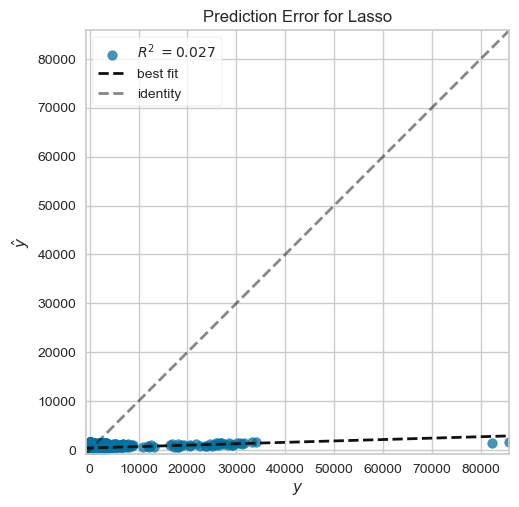

<AxesSubplot:title={'center':'Prediction Error for Lasso'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [94]:
#visualizer = PredictionError(lasso)
#visualizer.fit(X_train,y_train)
#visualizer.score(X_test,y_test)
#visualizer.poof()

/Users/chouma/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but Lasso was fitted with feature names
  warnings.warn(


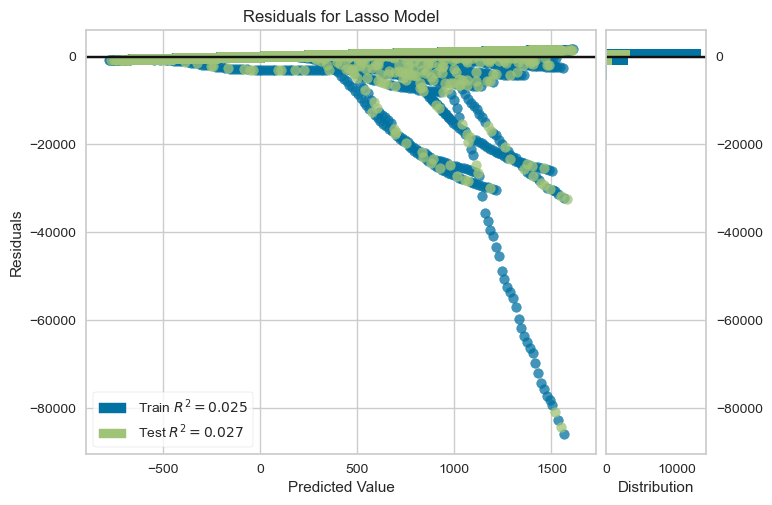

<AxesSubplot:title={'center':'Residuals for Lasso Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [100]:
#plotting the residuals 
#visualizer = ResidualsPlot(lasso)
#visualizer.fit(X_train,y_train)
#visualizer.score(X_test,y_test)
#visualizer.poof()

The residuals for a lasso model are the differences between the predicted values and the actual values of the target variable. They are used to measure the accuracy of the model, and can be used to identify areas where the model is not performing well.

- en remarque que la distrubition n'est pas normale 

In [251]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

## Create XGBoost Model

In [210]:
xgb.XGBClassifier().get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': None,
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [262]:
reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[10:04:50] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1667849653518/work/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:3317.72380	validation_1-rmse:3189.28793
[100]	validation_0-rmse:2355.45468	validation_1-rmse:2567.33789
[200]	validation_0-rmse:2048.33683	validation_1-rmse:2327.50963
[300]	validation_0-rmse:1785.47099	validation_1-rmse:2064.82039
[400]	validation_0-rmse:1591.68845	validation_1-rmse:1880.15752
[500]	validation_0-rmse:1444.10037	validation_1-rmse:1733.27991
[600]	validation_0-rmse:1321.01403	validation_1-rmse:1597.53716
[700]	validation_0-rmse:1220.04434	validation_1-rmse:1477.32932
[800]	validation_0-rmse:1122.17018	validation_1-rmse:1355.63264
[900]	validation_0-rmse:1049.52814	validation_1-rmse:1269.25208
[999]	validation_0-rmse:981.73880	validation_1-rmse:1187.15208


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=50, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.01, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=3, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, objective='reg:linear', predictor='auto', ...)

In [263]:
reg.feature_importances_

array([0.7155871 , 0.28441295], dtype=float32)

In [264]:
reg.score(X_test,y_test)

0.8596559040306279

In [265]:
y_pred=reg.predict(X_test)
y_pred

array([ -9.61969 , -28.852207, 741.8806  , ..., 464.81598 , 464.81598 ,
       902.18823 ], dtype=float32)

In [266]:
rmse = (mean_squared_error(y_test, y_pred)%1)
print("RMSE: %f" , (rmse))

RMSE: %f 0.050787813030183315


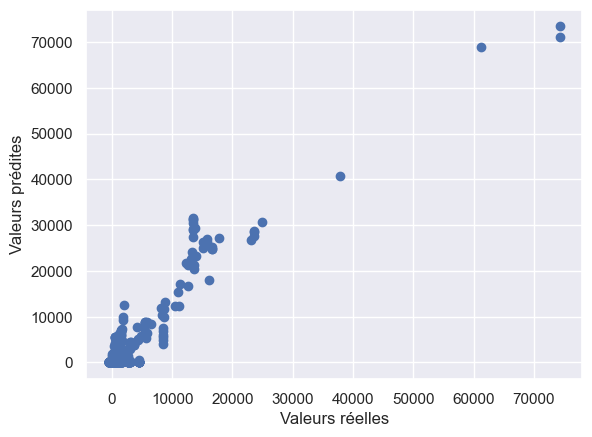

In [267]:
plt.scatter(y_pred,y_test)


plt.xlabel("Valeurs réelles")
plt.ylabel("Valeurs prédites")
plt.show()